# 01 Import libraries

In [1]:
import pandas as pd
import numpy as np 
import os 
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import plotly.express as px
import folium
import json

In [2]:
# Display settings
pd.set_option('display.max_columns', 100)
pd.set_option('display.width', 200)

In [3]:
%matplotlib inline

# 02 Import data 

In [3]:
path = r'/Users/woodoooo/Desktop/World University Rankings'

In [4]:
file = os.path.join(path, '02_Data', 'Prepared Data', 'QS_Rankings_selected_col_cleaned.xlsx')

In [5]:
df = pd.read_excel(file)

# 03 Correlation Matrix 

In [6]:
# Create a correlation matrix using pandas

df.corr(numeric_only=True)

,Rank_num,Previous Rank_num,AR SCORE,ER SCORE,FSR SCORE,CPF SCORE,IFR SCORE,ISR SCORE,ISD SCORE,IRN SCORE,EO SCORE,SUS SCORE,AR RANK_num,ER RANK_num,FSR RANK_num,CPF RANK_num,IFR RANK_num,ISR RANK_num,ISD RANK_num,IRN RANK_num,EO RANK_num,SUS RANK_num,Overall SCORE
Rank_num,1.000000,0.985441,-0.783479,-0.732806,-0.346863,-0.696151,-0.562336,-0.511844,-0.516801,-0.705502,-0.607613,-0.796982,0.805638,0.730865,0.334585,0.701362,0.552094,0.504253,0.510945,0.689258,0.602755,0.775664,-0.949420
Previous Rank_num,0.985441,1.000000,-0.784102,-0.718669,-0.368526,-0.686012,-0.569584,-0.530523,-0.531750,-0.684779,-0.604039,-0.773346,0.806070,0.715767,0.358459,0.692862,0.559693,0.524996,0.527996,0.683558,0.600590,0.768942,-0.932080
AR SCORE,-0.783479,-0.784102,1.000000,0.859109,0.294859,0.481956,0.391269,0.371677,0.366489,0.585021,0.685434,0.714747,-0.961318,-0.829013,-0.287935,-0.489470,-0.381548,-0.367418,-0.363511,-0.667784,-0.673366,-0.753376,0.904965
ER SCORE,-0.732806,-0.718669,0.859109,1.000000,0.287193,0.394749,0.338324,0.341932,0.344193,0.418693,0.662579,0.603865,-0.829335,-0.972461,-0.282808,-0.402256,-0.331884,-0.338684,-0.343526,-0.480108,-0.652560,-0.629404,0.785898
FSR SCORE,-0.346863,-0.368526,0.294859,0.287193,1.000000,0.031583,0.157685,0.227351,0.222837,0.059847,0.185700,0.153594,-0.277159,-0.271760,-0.984627,-0.036997,-0.157052,-0.218482,-0.212457,-0.143347,-0.178976,-0.188005,0.312008
CPF SCORE,-0.696151,-0.686012,0.481956,0.394749,0.031583,1.000000,0.382733,0.310253,0.298866,0.546258,0.305956,0.551549,-0.477522,-0.385091,-0.023090,-0.990410,-0.380078,-0.306887,-0.300387,-0.507315,-0.307189,-0.536596,0.493507
IFR SCORE,-0.562336,-0.569584,0.391269,0.338324,0.157685,0.382733,1.000000,0.670696,0.669386,0.357051,0.311737,0.450587,-0.394235,-0.335147,-0.148301,-0.388040,-0.991172,-0.664652,-0.660756,-0.397332,-0.315873,-0.478597,0.383851
ISR SCORE,-0.511844,-0.530523,0.371677,0.341932,0.227351,0.310253,0.670696,1.000000,0.986115,0.298774,0.259978,0.416564,-0.359333,-0.323461,-0.217950,-0.313374,-0.666192,-0.992496,-0.980545,-0.342887,-0.255870,-0.453767,0.405303
ISD SCORE,-0.516801,-0.531750,0.366489,0.344193,0.222837,0.298866,0.669386,0.986115,1.000000,0.305527,0.257357,0.444573,-0.359377,-0.328394,-0.214672,-0.303829,-0.664060,-0.979089,-0.991929,-0.343469,-0.255790,-0.479620,0.381191
IRN SCORE,-0.705502,-0.684779,0.585021,0.418693,0.059847,0.546258,0.357051,0.298774,0.305527,1.000000,0.438009,0.753867,-0.594742,-0.418820,-0.058558,-0.531325,-0.343786,-0.287979,-0.300904,-0.883227,-0.427503,-0.689534,0.518193


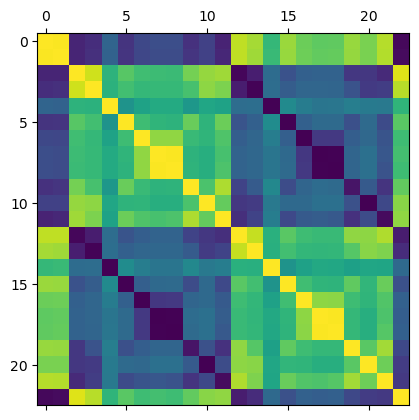

In [7]:
plt.matshow(df.corr(numeric_only=True))

In [8]:
df.columns

Index(['Rank_num', 'Rank_sym', 'Previous Rank_num', 'Previous Rank_sym', 'Name', 'Country/Territory', 'Region', 'Size', 'Focus', 'Research', 'Status', 'AR SCORE', 'ER SCORE', 'FSR SCORE',
       'CPF SCORE', 'IFR SCORE', 'ISR SCORE', 'ISD SCORE', 'IRN SCORE', 'EO SCORE', 'SUS SCORE', 'AR RANK_num', 'AR RANK_sym', 'ER RANK_num', 'ER RANK_sym', 'FSR RANK_num', 'FSR RANK_sym',
       'CPF RANK_num', 'CPF RANK_sym', 'IFR RANK_num', 'IFR RANK_sym', 'ISR RANK_num', 'ISR RANK_sym', 'ISD RANK_num', 'ISD RANK_sym', 'IRN RANK_num', 'IRN RANK_sym', 'EO RANK_num', 'EO RANK_sym',
       'SUS RANK_num', 'SUS RANK_sym', 'Overall SCORE'],
      dtype='object')

In [9]:
# Create a subset excluding the "Index" and Symbol columns


sub = df[['Rank_num', 'Previous Rank_num','AR SCORE', 'ER SCORE', 'FSR SCORE', 'CPF SCORE', 'IFR SCORE', 'ISR SCORE',
          'ISD SCORE', 'IRN SCORE', 'EO SCORE', 'SUS SCORE', 'AR RANK_num', 'ER RANK_num', 'FSR RANK_num', 'CPF RANK_num',
          'IFR RANK_num', 'ISR RANK_num', 'ISD RANK_num', 'IRN RANK_num', 'EO RANK_num', 'SUS RANK_num', 'Overall SCORE']]

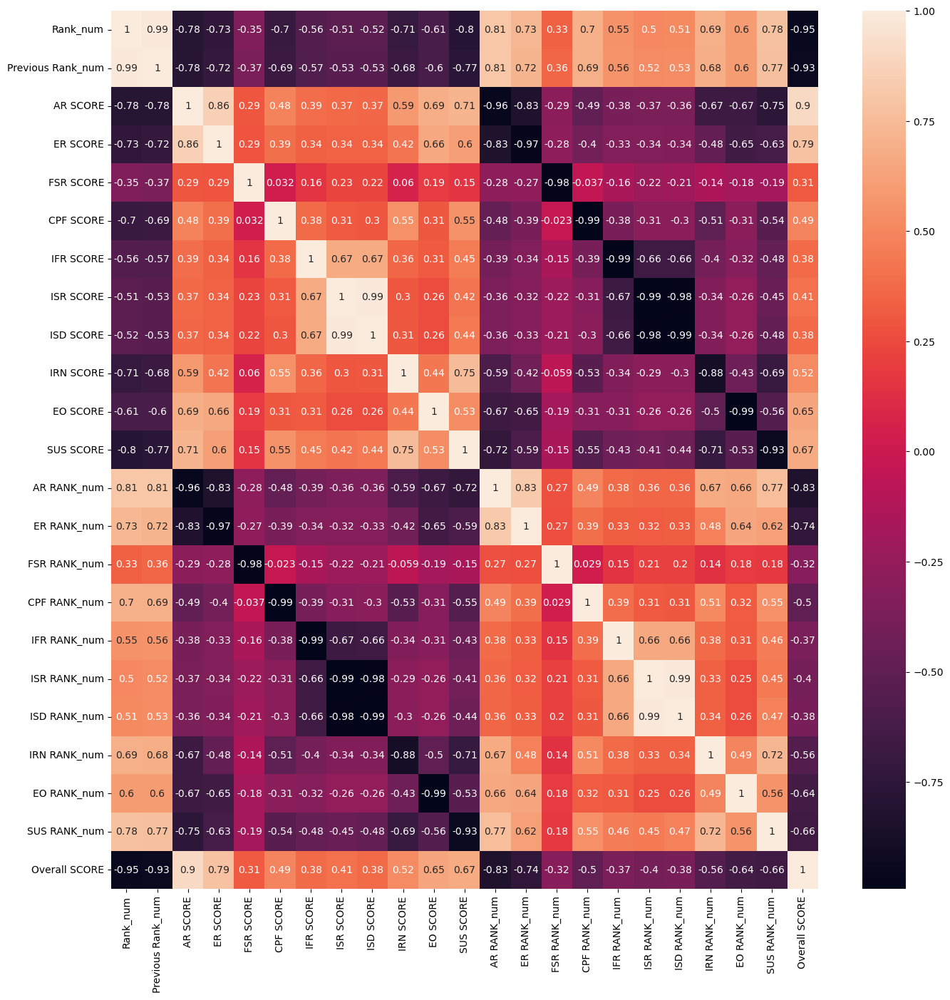

In [10]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(16,16))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr = sns.heatmap(sub.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

plt.savefig(os.path.join(path, '04 Analysis', 'Visualisation', "corrmatrixmatplotlib.png"), dpi=300, bbox_inches="tight") 

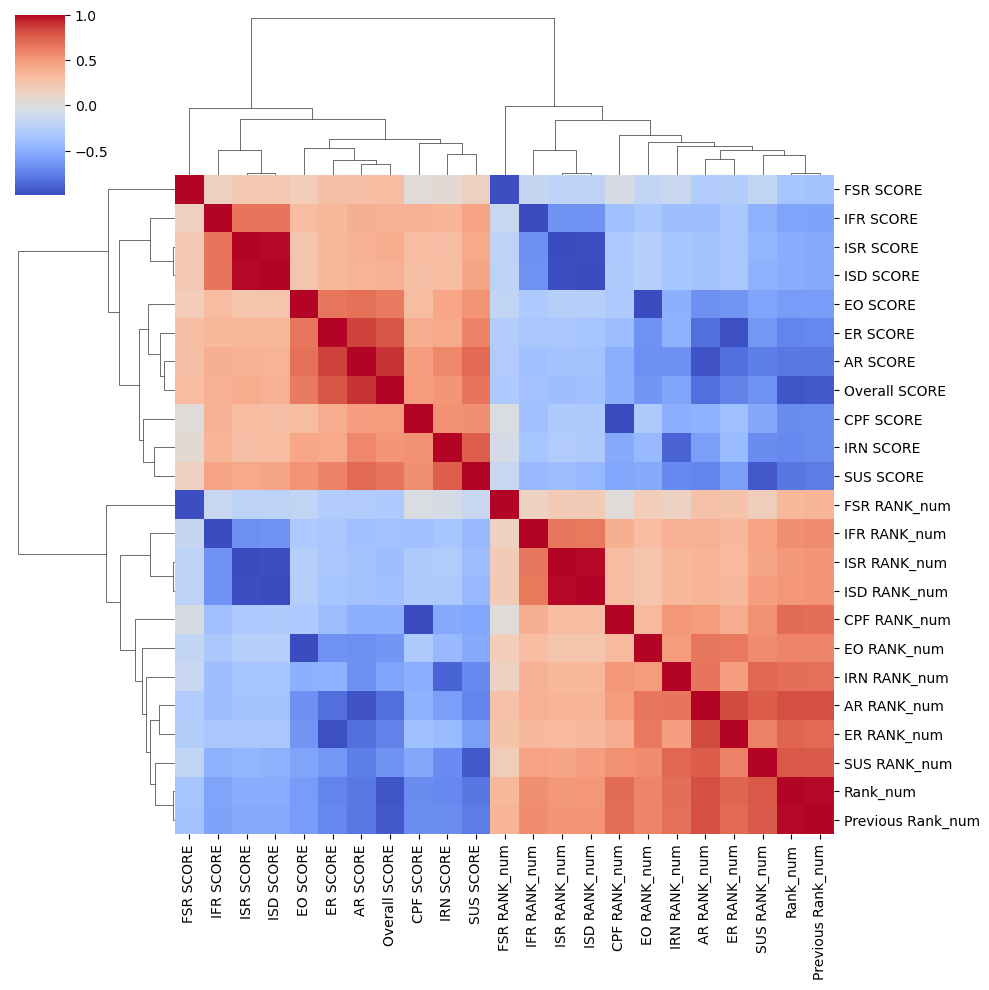

In [11]:
# clustermap of correlations

sns.clustermap(df.corr(numeric_only=True), cmap="coolwarm", annot=False)

In [12]:
# correltion matrix 
corr = df.corr(numeric_only=True)

corr_pairs = corr.unstack().reset_index()
corr_pairs.columns = ['Variable_1', 'Variable_2', 'Correlation']
corr_pairs = corr_pairs[corr_pairs['Variable_1'] < corr_pairs['Variable_2']]

corr_pairs['AbsCorrelation'] = corr_pairs['Correlation'].abs()
top_corrs = corr_pairs.sort_values('AbsCorrelation', ascending=False)

# top7 positive correlations
print("Top 7 positive correlations:")
print(top_corrs[top_corrs['Correlation'] > 0].head(7))

# top7 negative correlations
print("\nTop 7 negative correlations:")
print(top_corrs[top_corrs['Correlation'] < 0].head(7))


Top 7 positive correlations:
            Variable_1         Variable_2  Correlation  AbsCorrelation
191          ISD SCORE          ISR SCORE     0.986115        0.986115
431       ISD RANK_num       ISR RANK_num     0.985721        0.985721
23   Previous Rank_num           Rank_num     0.985441        0.985441
68            AR SCORE      Overall SCORE     0.904965        0.904965
49            AR SCORE           ER SCORE     0.859109        0.859109
289        AR RANK_num        ER RANK_num     0.826197        0.826197
277        AR RANK_num  Previous Rank_num     0.806070        0.806070

Top 7 negative correlations:
       Variable_1 Variable_2  Correlation  AbsCorrelation
398  ISR RANK_num  ISR SCORE    -0.992496        0.992496
422  ISD RANK_num  ISD SCORE    -0.991929        0.991929
374  IFR RANK_num  IFR SCORE    -0.991172        0.991172
350  CPF RANK_num  CPF SCORE    -0.990410        0.990410
470   EO RANK_num   EO SCORE    -0.985138        0.985138
326  FSR RANK_num  FSR SC

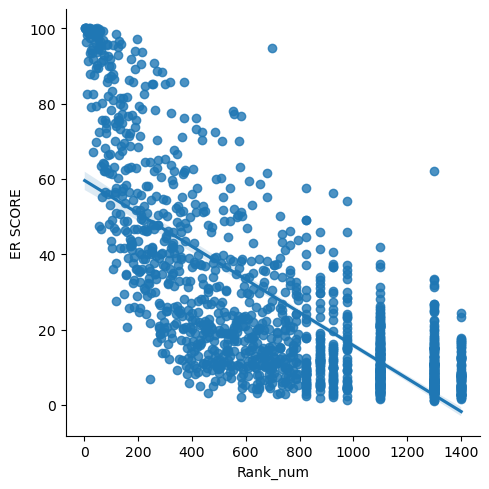

In [13]:
# Create scatterplot1

sns.lmplot(x = 'Rank_num', y = 'ER SCORE', data = df)

# 03 Correlation with Overall Score

In [14]:
# Compute correlations of sub-scores with Overall SCORE
# QS score columns (edit if your dataset uses slightly different labels)
score_cols = [
    'AR SCORE','ER SCORE','FSR SCORE','CPF SCORE','IFR SCORE','ISR SCORE',
    'ISD SCORE','IRN SCORE','EO SCORE','SUS SCORE'
]

sub_scores = [c for c in score_cols if c != 'Overall SCORE' and c in df.columns]

corr_with_overall = (
    df[sub_scores + ['Overall SCORE']]
    .corr(method='pearson')['Overall SCORE']
    .sort_values(ascending=False)
    .to_frame('Correlation_with_Overall')
)

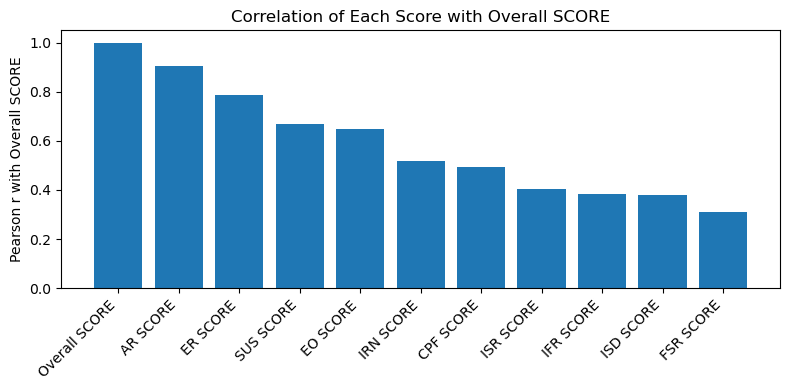

In [15]:
# Bar plot of correlations
vals = corr_with_overall['Correlation_with_Overall'].values
labels = corr_with_overall.index.tolist()

plt.figure(figsize=(8,4))
plt.bar(range(len(vals)), vals)
plt.xticks(range(len(vals)), labels, rotation=45, ha='right')
plt.ylabel('Pearson r with Overall SCORE')
plt.title('Correlation of Each Score with Overall SCORE')
plt.tight_layout()
plt.savefig(os.path.join(path, '04 Analysis', 'Visualisation', "Correlation_with_OverallScore.png"), dpi=300, bbox_inches="tight")
plt.show()

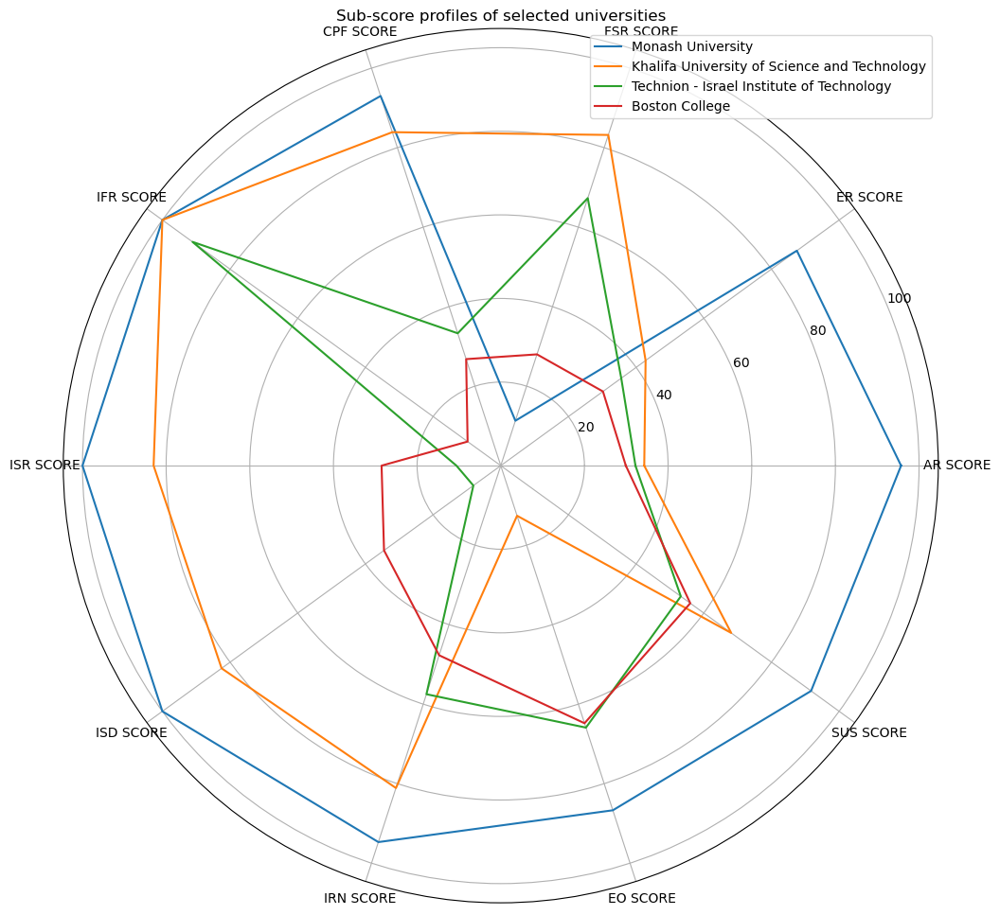

In [16]:
# Radar plot for top universities
# Pick a few universities (top, middle, low)
def pick_by_quantile(d, q, col='Overall SCORE'):
    d2 = d.dropna(subset=[col])
    target = d2[col].quantile(q)
    return d2.loc[(d2[col]-target).abs().idxmin()]

top = pick_by_quantile(df, 0.95)   # top Overall
high = pick_by_quantile(df, 0.75)   # high Overall
mid = pick_by_quantile(df, 0.50)   # median
low = pick_by_quantile(df, 0.25)   # low Overall

unis = pd.DataFrame([top, high, mid, low])


# Subscores only
categories = ['AR SCORE','ER SCORE','FSR SCORE','CPF SCORE','IFR SCORE',
              'ISR SCORE','ISD SCORE','IRN SCORE','EO SCORE','SUS SCORE']

# Normalize 0–100
df_radar = unis[categories]
df_radar.index = unis['Name']

from math import pi


N = len(categories)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

plt.figure(figsize=(12,12))

for i, row in df_radar.iterrows():
    values = row.values.flatten().tolist()
    values += values[:1]
    plt.polar(angles, values, label=i)

plt.xticks(angles[:-1], categories, rotation=45)
plt.title("Sub-score profiles of selected universities")
plt.legend()
plt.savefig(os.path.join(path, '04 Analysis', 'Visualisation', "radarplottopuni.png"), dpi=300, bbox_inches="tight")
plt.show()

Do universities with higher Overall Scores also rank high across all sub-scores, or are there trade-offs? 
Yes for Monash (almost uniformly high), but there are trade-offs: e.g., Khalifa (international > reputation), Technion (reputation > internationalization), Boston College (graduate outcomes > research).

On radarplot we took 4 randon universities from 4 different quartiles - 25,50,75,95. 

Monash University (blue):
Very strong overall — close to the outer ring in most metrics (AR, ER, FSR, ISD, IRN, SUS).
Especially impressive in Internationalization scores (IFR, ISR) and Research (CPF).
Looks like an “all-rounder” with only small dips.
Khalifa University of Science and Technology (orange):
Also strong in IFR, ISR, ISD (international profile).
Lower in AR and ER, meaning reputation is weaker compared to Monash.
Balanced but not top-tier in Sustainability.
Technion – Israel Institute of Technology (green):
Strength in ER (Employer Reputation) and some research dimensions.
Weaker in IFR/ISR (international ratios).
The shape is spikier — some strong points, some weak points → a trade-off profile.
Boston College (red):
Generally lower across most dimensions.
Strongest in EO (Employment Outcomes) and moderate in Sustainability.
Much weaker in research-related (CPF, ISD, IRN) and internationalization scores.



# 04 Distribution of Overall Scores

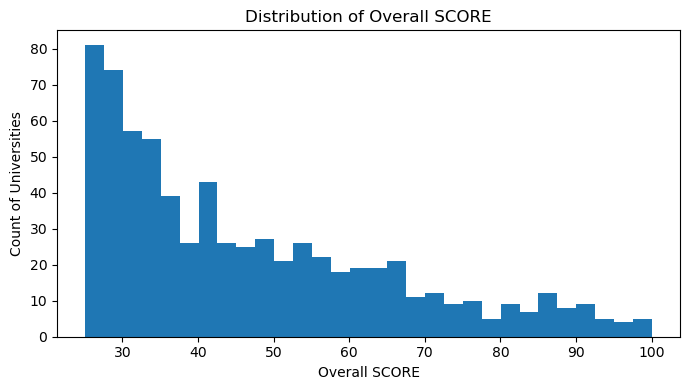

N: 705 Mean: 46.7 Median: 41.5


In [17]:
# Take Overall SCORE (drop NaN values)
overall = df['Overall SCORE'].dropna()

# Plot histogram
plt.figure(figsize=(7,4))
plt.hist(overall, bins=30)
plt.xlabel('Overall SCORE')
plt.ylabel('Count of Universities')
plt.title('Distribution of Overall SCORE')
plt.tight_layout()
plt.show()

# Print summary stats
print(
    'N:', overall.shape[0],
    'Mean:', round(overall.mean(), 2),
    'Median:', round(overall.median(), 2)
)

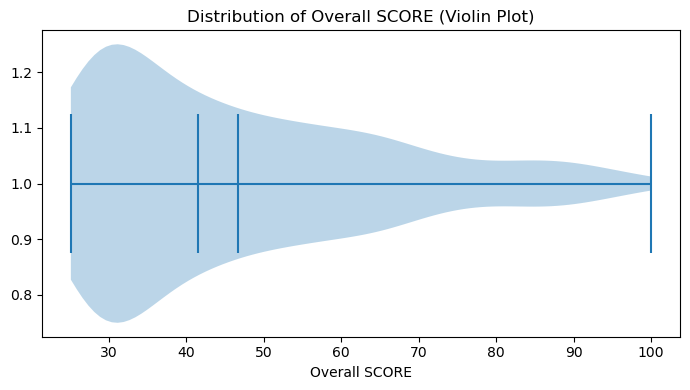

N: 705
Min: 25.1
Max: 100.0
Mean: 46.70439716312057
Median: 41.5


In [18]:
# Take Overall SCORE (drop NaN values)
overall = df['Overall SCORE'].dropna()

# Plot violin plot
plt.figure(figsize=(7,4))
plt.violinplot(overall, vert=False, showmeans=True, showextrema=True, showmedians=True)
plt.xlabel('Overall SCORE')
plt.title('Distribution of Overall SCORE (Violin Plot)')
plt.tight_layout()
plt.show()

# Print summary stats
print("N:", overall.shape[0])
print("Min:", overall.min())
print("Max:", overall.max())
print("Mean:", overall.mean())
print("Median:", overall.median()
)

In [19]:
import plotly.express as px

fig = px.violin(
    df, 
    x="Region", 
    y="Overall SCORE", 
    box=True,       # adds a boxplot inside
    points="all",   # shows individual points
    hover_data=df.columns
)

# Clean background
fig.update_layout(
    plot_bgcolor="white",   # inside plotting area
    paper_bgcolor="white"   # outside area
)

# Save high-res image
fig.write_image(
    os.path.join(path, '04 Analysis', 'Visualisation', "violinplot.png"),
    scale=3
)

fig.show()


What is the distribution of Overall Scores across universities (by region)?

Most universities cluster in the 30–60 score range across all regions. The violins are widest in this middle zone, meaning that’s where the majority of universities lie.
High performers are rare: Only a small fraction of universities achieve scores above 80. These appear as thinner “tails” at the top of the violins (a few top performers stretching the distribution upward).

The violin plot confirms that global rankings are driven by a relatively small group of elite universities, while the majority occupy mid-range positions.
Regional differences:
Europe & Asia: Very wide violins in the middle ranges, suggesting a large number of mid-ranked institutions, plus a few elite ones above 90.
Americas: Similar clustering, but with slightly higher median and more spread toward the top.
Oceania: Fewer institutions overall, but also concentrated around the mid-scores (40–60) with a handful high-scoring universities.
Africa: Very small sample, mostly clustered around 40–50, with no very high-scoring outliers.


In [20]:
import altair as alt

# 1) make sure Overall SCORE is numeric
df['Overall SCORE'] = pd.to_numeric(df['Overall SCORE'], errors='coerce')

# 2) (optional) avoid max-rows truncation
alt.data_transformers.disable_max_rows()

# 3) violin-style density ridges by Region (horizontal)
alt.Chart(df).transform_density(
    'Overall SCORE',
    as_=['Overall SCORE', 'density'],
    groupby=['Region']
).mark_area(orient='horizontal').encode(
    y=alt.Y('Overall SCORE:Q', title='Overall SCORE'),
    x=alt.X('density:Q', title='Density'),
    color='Region:N',
    row=alt.Row('Region:N', header=alt.Header(labelAngle=0))  # one row per Region
).properties(
    height=80,  # per-row height
    width=400
)

alt.Chart(...)

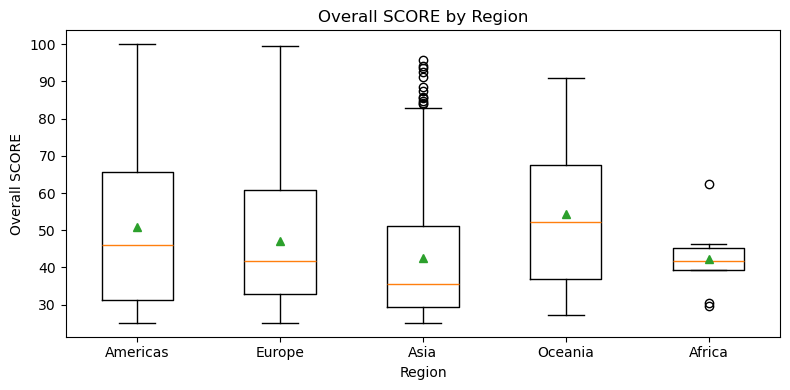

In [42]:
# Overall SCORE by Region
boxplot_by_category(df, 'Region', 'Overall SCORE',
                    title='Overall SCORE by Region')

In [43]:
# Note:
# For each region:
# Box (rectangle) = the middle 50% of universities (from the 25th percentile to the 75th percentile).
# Line inside the box (orange) = the median (50th percentile).
# Green triangle = the mean (average).
# Whiskers (vertical lines) = data spread up to ~1.5× the interquartile range (IQR).
# Dots (circles) = outliers (universities with scores much higher or lower than most in their region).


# Europe & Americas dominate the full range: they have many high performers but also low scorers.

# Oceania shows higher average/mid-level performance (good consistency).

# Asia is more polarized: many lower scores, but also some of the top universities in the world (outliers at the top).

# Africa shows limited variability — universities tend to cluster in the lower-middle score range.

# 05 Exploring relationships. Scatterplots and pair scatterplots

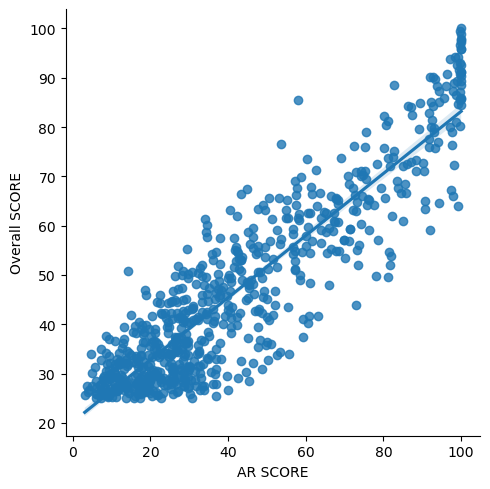

In [22]:
# Create scatterplot

sns.lmplot(x = 'AR SCORE', y = 'Overall SCORE', data = df)

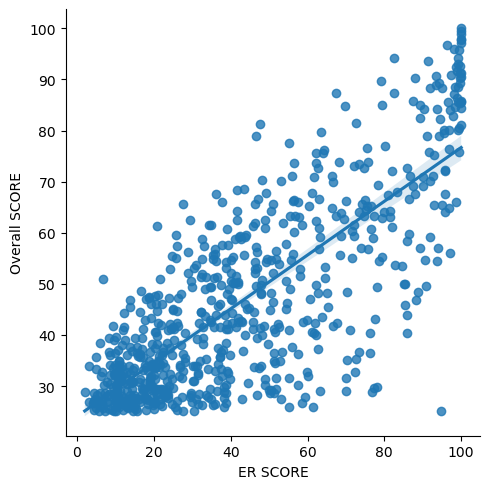

In [23]:
# Create scatterplot

sns.lmplot(x = 'ER SCORE', y = 'Overall SCORE', data = df)

In [24]:
# Create a subset for Rank and Previous Rank & all SCORES


sub_scores = df[['Rank_num', 'Previous Rank_num', 'AR SCORE', 'ER SCORE', 'FSR SCORE',
          'CPF SCORE', 'IFR SCORE', 'ISR SCORE',
          'ISD SCORE', 'IRN SCORE',
          'EO SCORE', 'SUS SCORE', 'Overall SCORE']]

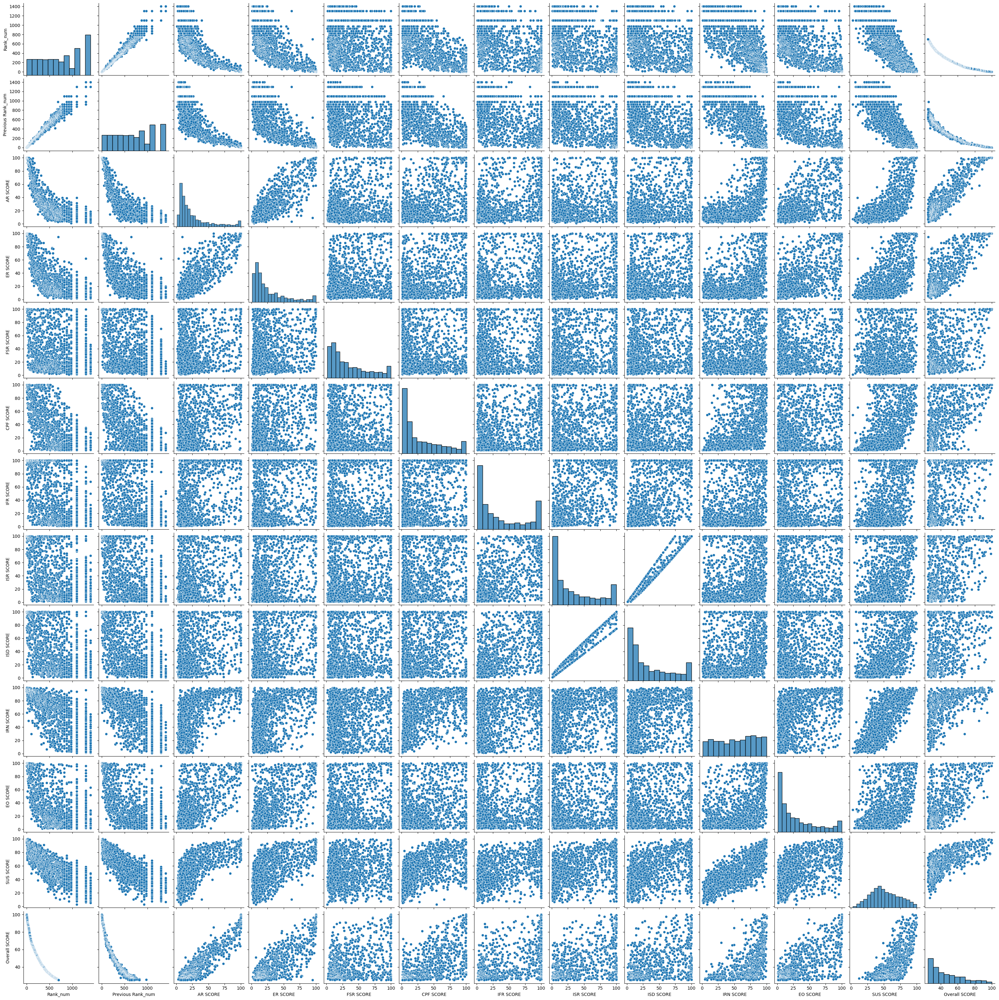

In [25]:
# Create a pair plot 

g = sns.pairplot(sub_scores)
plt.savefig("scatterplot_allscores.png", dpi=300, bbox_inches="tight") 
plt.show()

# 06 Regional & Country Comparisons

In [26]:
# --- Top-100 universities by Rank_num ---
top100 = df[df['Rank_num'].between(1, 100, inclusive='both')].copy()

# --- Regions dominating Top-100 ---
if 'Region' in df.columns:
    reg_top100 = (
        top100.groupby('Region')['Name']
        .count()
        .sort_values(ascending=False)
    )
    print("Top-100 count by Region:")
    display(reg_top100)

Top-100 count by Region:


Region
Europe      37
Americas    31
Asia        22
Oceania     10
Name: Name, dtype: int64

In [27]:

# --- Average Overall SCORE by Region ---
if 'Region' in df.columns and 'Overall SCORE' in df.columns:
    avg_overall_by_region = (
        df.groupby('Region')['Overall SCORE']
        .mean()
        .sort_values(ascending=False)
    )
    print("\nAverage Overall by Region:")
    display(avg_overall_by_region)


Average Overall by Region:


Region
Oceania     54.238462
Americas    50.913793
Europe      47.099634
Asia        42.637238
Africa      42.255556
Name: Overall SCORE, dtype: float64

In [28]:
# --- Average Overall SCORE by Country ---
if 'Country/Territory' in df.columns and 'Overall SCORE' in df.columns:
    avg_overall_by_country = (
        df.groupby('Country/Territory')['Overall SCORE']
        .mean()
        .sort_values(ascending=False)
    )
    top_countries_by_avg = avg_overall_by_country.head(15)
    print("\nTop 15 Countries by Avg Overall SCORE:")
    display(top_countries_by_avg)


Top 15 Countries by Avg Overall SCORE:


Country/Territory
Hong Kong SAR, China        72.600000
Singapore                   63.125000
Netherlands                 61.669231
Switzerland                 61.200000
Mexico                      60.550000
Sweden                      59.962500
Qatar                       58.700000
Denmark                     58.040000
Australia                   55.077419
United Kingdom              54.060000
Japan                       53.362500
United States of America    52.871429
Ireland                     51.966667
Belgium                     51.450000
New Zealand                 50.987500
Name: Overall SCORE, dtype: float64

In [29]:
# --- Median Overall SCORE by Country ---
if 'Country/Territory' in df.columns and 'Overall SCORE' in df.columns:
    median_overall_by_country = (
        df.groupby('Country/Territory')['Overall SCORE']
        .median()   # <-- заменили mean() на median()
        .sort_values(ascending=False)
    )
    top_countries_by_median = median_overall_by_country.head(15)
    print("\nTop 15 Countries by Median Overall SCORE:")
    display(top_countries_by_median)


Top 15 Countries by Median Overall SCORE:


Country/Territory
Hong Kong SAR, China    81.20
Denmark                 64.30
Singapore               62.65
Netherlands             62.50
Sweden                  61.35
Switzerland             61.30
Mexico                  60.55
Qatar                   58.70
Japan                   57.70
Australia               53.10
New Zealand             50.35
Belgium                 50.25
United Kingdom          49.75
Colombia                49.50
Ireland                 48.90
Name: Overall SCORE, dtype: float64

In [30]:
# --- Distribution of Ranked Universities by Country (Top 20)s ---
if 'Country/Territory' in df.columns:
    count_by_country = (
        df.groupby('Country/Territory')['Name']
        .count()
        .sort_values(ascending=False)
    )
    print("\nDistribution of Ranked Universities by Country (Top 20):")
    display(count_by_country.head(20))



Distribution of Ranked Universities by Country (Top 20):


Country/Territory
United States of America    192
United Kingdom               90
China (Mainland)             72
India                        54
Germany                      49
Japan                        47
Italy                        43
Republic of Korea            43
Russian Federation           40
Spain                        38
Australia                    36
France                       35
Malaysia                     32
Canada                       29
Taiwan                       28
Indonesia                    26
Türkiye                      26
Brazil                       24
Mexico                       22
Saudi Arabia                 22
Name: Name, dtype: int64

In [31]:
# Are certain regions stronger in specific dimensions (e.g., research intensity in North America vs. teaching in Europe)?

In [32]:
metrics = [
    'AR SCORE','ER SCORE','FSR SCORE','CPF SCORE','IFR SCORE',
    'ISR SCORE','ISD SCORE','IRN SCORE','EO SCORE','SUS SCORE'
]
# Average per region
region_mean = df.groupby('Region')[metrics].mean().round(1)
display(region_mean)

,AR SCORE,ER SCORE,FSR SCORE,CPF SCORE,IFR SCORE,ISR SCORE,ISD SCORE,IRN SCORE,EO SCORE,SUS SCORE
Region,,,,,,,,,,
Africa,16.6,17.1,17.0,12.5,20.3,11.1,13.5,62.5,46.1,45.2
Americas,27.8,28.3,33.5,26.8,27.1,25.3,26.0,51.3,36.3,51.9
Asia,21.9,26.5,34.7,29.7,32.4,23.6,25.2,40.0,22.8,44.2
Europe,28.3,26.8,36.6,32.3,43.9,48.3,49.5,67.7,31.1,57.0
Oceania,40.7,33.7,17.7,68.4,88.2,77.4,77.0,73.6,40.2,77.3


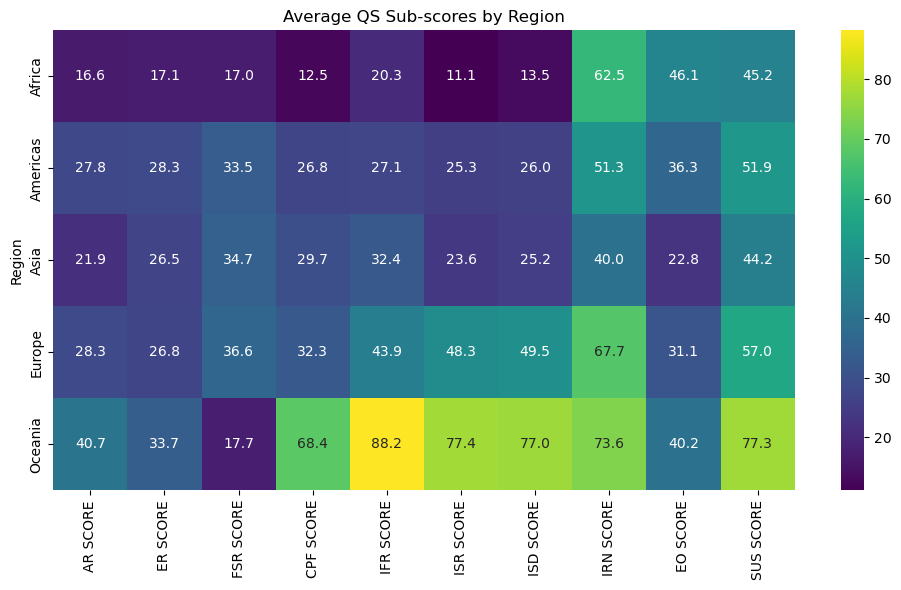

In [33]:
plt.figure(figsize=(10,6))
sns.heatmap(region_mean, annot=True, cmap="viridis", fmt=".1f")
plt.title("Average QS Sub-scores by Region")
plt.tight_layout()

# Save
out_dir = os.path.join(path, '04 Analysis', 'Visualisation')
os.makedirs(out_dir, exist_ok=True)
plt.savefig(os.path.join(out_dir, "regional_means_heatmap.png"), dpi=300, bbox_inches="tight")
plt.show()


,AR SCORE,ER SCORE,FSR SCORE,CPF SCORE,IFR SCORE,ISR SCORE,ISD SCORE,IRN SCORE,EO SCORE,SUS SCORE
Region,,,,,,,,,,
Africa,-0.37,-0.38,-0.60,-0.60,-0.45,-0.68,-0.68,0.32,0.55,-0.28
Americas,0.08,0.05,-0.02,-0.12,-0.26,-0.24,-0.28,-0.07,0.22,0.03
Asia,-0.16,-0.02,0.03,-0.02,-0.11,-0.30,-0.30,-0.46,-0.24,-0.33
Europe,0.10,-0.01,0.09,0.06,0.22,0.46,0.48,0.49,0.04,0.27
Oceania,0.61,0.27,-0.57,1.28,1.47,1.34,1.36,0.70,0.35,1.23


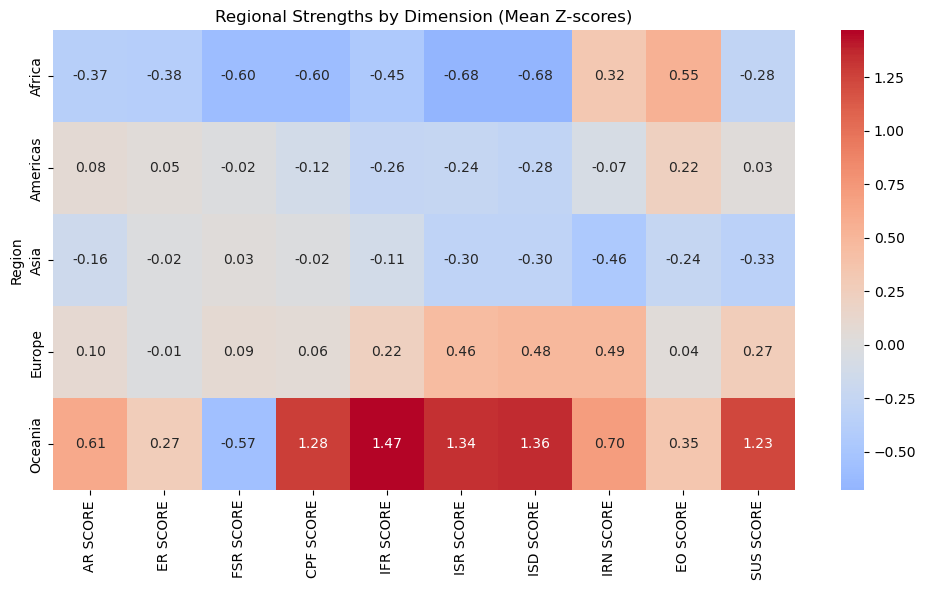

In [34]:
# Z-scores: relative to global mean/std
df_z = df.copy()
for c in metrics:
    mu, sigma = df[c].mean(skipna=True), df[c].std(skipna=True)
    df_z[c] = (df[c] - mu) / sigma

region_strengths = df_z.groupby('Region')[metrics].mean().round(2)
display(region_strengths)

plt.figure(figsize=(10,6))
sns.heatmap(region_strengths, annot=True, cmap="coolwarm", center=0, fmt=".2f")
plt.title("Regional Strengths by Dimension (Mean Z-scores)")
plt.tight_layout()
plt.savefig(os.path.join(out_dir, "regional_strengths_mean_z_heatmap.png"), dpi=300, bbox_inches="tight")
plt.show()

,AR SCORE,ER SCORE,FSR SCORE,CPF SCORE,IFR SCORE,ISR SCORE,ISD SCORE,IRN SCORE,EO SCORE,SUS SCORE
Region,,,,,,,,,,
Africa,11.4,12.4,8.6,5.3,8.4,5.9,10.1,64.4,33.2,42.2
Americas,16.0,17.4,22.5,18.4,14.4,11.1,12.7,52.0,28.1,48.9
Asia,14.3,15.8,24.8,13.0,16.6,10.1,13.3,36.0,11.0,43.0
Europe,18.0,17.4,28.2,23.2,34.2,43.6,46.4,74.6,19.6,56.6
Oceania,34.7,23.3,13.9,71.8,98.6,86.1,83.9,81.9,26.2,83.5


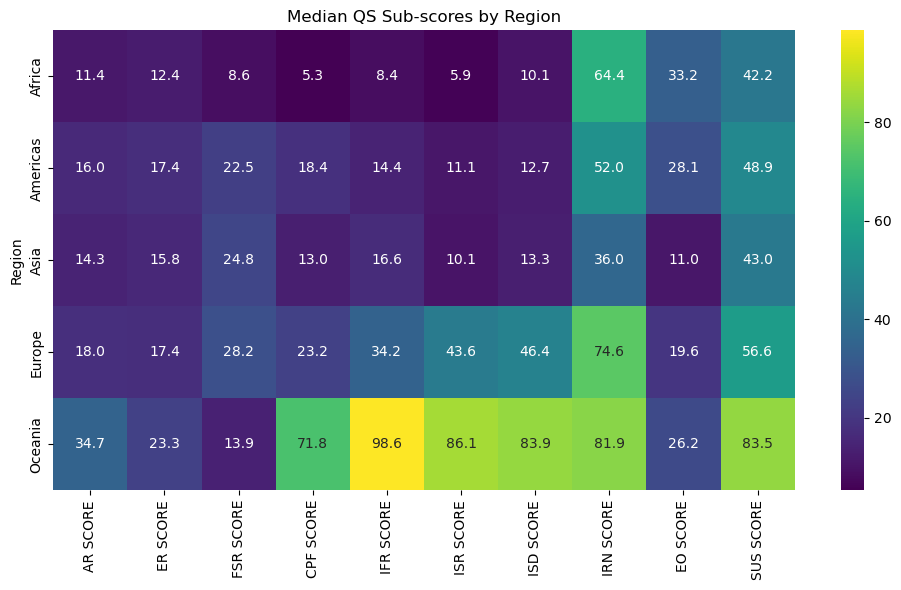

In [35]:
# Median per region
region_median = df.groupby('Region')[metrics].median().round(1)
display(region_median)

plt.figure(figsize=(10,6))
sns.heatmap(region_median, annot=True, cmap="viridis", fmt=".1f")
plt.title("Median QS Sub-scores by Region")
plt.tight_layout()

# Save
out_dir = os.path.join(path, '04 Analysis', 'Visualisation')
os.makedirs(out_dir, exist_ok=True)
plt.savefig(os.path.join(out_dir, "regional_median_heatmap.png"), dpi=300, bbox_inches="tight")
plt.show()


,AR SCORE,ER SCORE,FSR SCORE,CPF SCORE,IFR SCORE,ISR SCORE,ISD SCORE,IRN SCORE,EO SCORE,SUS SCORE
Region,,,,,,,,,,
Africa,-0.59,-0.57,-0.89,-0.85,-0.79,-0.84,-0.79,0.38,0.11,-0.42
Americas,-0.40,-0.38,-0.41,-0.41,-0.62,-0.68,-0.70,-0.05,-0.06,-0.11
Asia,-0.47,-0.44,-0.32,-0.59,-0.56,-0.71,-0.68,-0.60,-0.65,-0.39
Europe,-0.32,-0.37,-0.20,-0.25,-0.06,0.31,0.38,0.73,-0.35,0.25
Oceania,0.36,-0.14,-0.71,1.39,1.77,1.61,1.59,0.99,-0.13,1.52


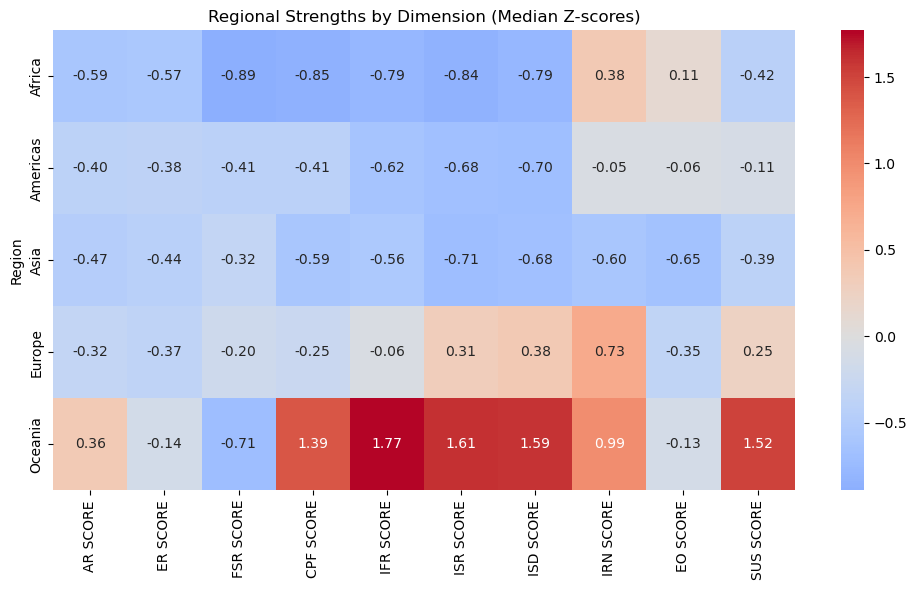

In [36]:
# --- Regional Strengths by Dimension (Z-scores, median-based) ---

# 1. Standardize each metric across universities
df_z = df.copy()
for c in metrics:
    mu = df[c].mean(skipna=True)
    sigma = df[c].std(skipna=True)
    df_z[c] = (df[c] - mu) / sigma

# 2. Aggregate by region (median of z-scores)
region_median_z = df_z.groupby('Region')[metrics].median().round(2)
display(region_median_z)

# 3. Heatmap
plt.figure(figsize=(10,6))
sns.heatmap(region_median_z, annot=True, cmap="coolwarm", center=0, fmt=".2f")
plt.title("Regional Strengths by Dimension (Median Z-scores)")
plt.tight_layout()

# Save
out_dir = os.path.join(path, '04 Analysis', 'Visualisation')
os.makedirs(out_dir, exist_ok=True)
plt.savefig(os.path.join(out_dir, "regional_median_z_heatmap.png"), dpi=300, bbox_inches="tight")
plt.show()


# 08 Institutional Characteristics (Size, Status, Focus)

In [37]:
# GROUPING Size

size_order = pd.CategoricalDtype(categories=['S','M','L','XL'], ordered=True)
df['Size'] = df['Size'].astype(size_order)

# Columns to summarize
metrics_basic = ['Rank_num', 'Overall SCORE']

size_summary = (
    df.dropna(subset=['Size'])                       # keep only rows with Size
      .groupby('Size', observed=True)[metrics_basic]
      .agg(Count=('Rank_num', 'size'),
           Mean_Rank=('Rank_num', 'mean'),           # lower = better
           Median_Rank=('Rank_num', 'median'),
           Mean_Overall=('Overall SCORE', 'mean'),
           Median_Overall=('Overall SCORE', 'median'))
      .sort_index()                                  # respects S<M<L<XL
      .round(2)
)
print(size_summary)

      Count  Mean_Rank  Median_Rank  Mean_Overall  Median_Overall
Size                                                             
S        97     805.07        825.5         35.71            31.3
M       382     874.11        925.5         40.69            34.9
L       677     724.93        735.5         47.74            42.9
XL      347     630.51        542.0         51.33            48.0


In [38]:
# GROUPING: Public vs Private (Status) 

metrics_basic = ['Rank_num', 'Overall SCORE']

status_summary = (
    df.dropna(subset=['Status'])
      .groupby('Status', observed=True)[metrics_basic]
      .agg(Count=('Rank_num','size'),
           Mean_Rank=('Rank_num','mean'),
           Median_Rank=('Rank_num','median'),
           Mean_Overall=('Overall SCORE','mean'),
           Median_Overall=('Overall SCORE','median'))
      .round(2)
)

print(status_summary)

                        Count  Mean_Rank  Median_Rank  Mean_Overall  Median_Overall
Status                                                                             
Private for Profit         55    1033.94       1100.5         33.38            29.9
Private not for Profit    263     813.29        875.5         47.34            39.3
Public                   1185     717.98        705.5         46.89            41.8


In [39]:
# GROUPING: Focus

metrics_basic = ['Rank_num', 'Overall SCORE']

focus_summary = (
    df.dropna(subset=['Focus'])
      .groupby('Focus', observed=True)[metrics_basic]
      .agg(Count=('Rank_num','size'),
           Mean_Rank=('Rank_num','mean'),
           Median_Rank=('Rank_num','median'),
           Mean_Overall=('Overall SCORE','mean'),
           Median_Overall=('Overall SCORE','median'))
      .round(2)
)

print(focus_summary)

       Count  Mean_Rank  Median_Rank  Mean_Overall  Median_Overall
Focus                                                             
CO       494     835.43        875.5         40.60           35.10
FC       584     584.71        518.0         51.98           48.95
FO       341     852.42        875.5         43.15           36.50
SP        84     913.30        900.5         34.71           31.95


In [40]:
# Violin plots for key metrics (Rank_num and Overall SCORE) across each of your three groupings (Size, Status, Focus)

In [60]:
out_dir = os.path.join(path, '04 Analysis', 'Visualisation')
os.makedirs(out_dir, exist_ok=True)

# --- Clean subset used by all plots ---
need_cols = ['Size','Status','Focus','Rank_num','Overall SCORE']
d = df[need_cols].dropna(subset=['Size','Status','Focus'])  # keep NaNs in metrics out per-plot

# Category orders (adjust if your codes differ)
cat_orders = {
    'Size':   ['S','M','L','XL'],
    'Status': ['Public','Private not for Profit','Private for Profit'],
    'Focus':  ['FC','CO','FO','SP']
}

# Common figure tweaks
common_layout = dict(
    template='plotly_white',
    legend_title_text='Status',
    margin=dict(l=40, r=20, t=60, b=40),
)

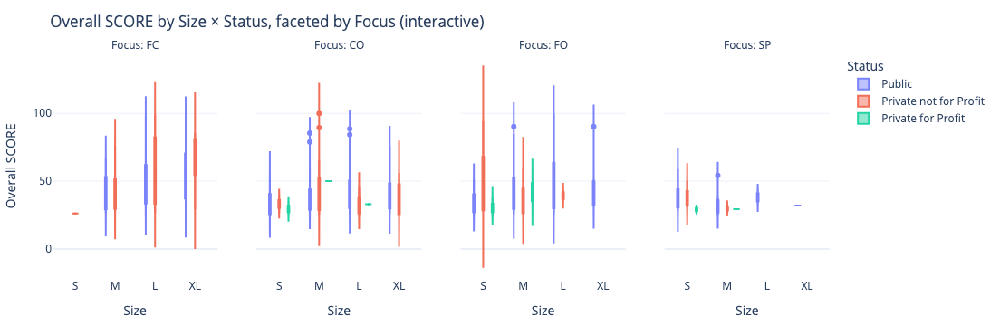

Saved PNG: /Users/woodoooo/Desktop/World University Rankings/04 Analysis/Visualisation/faceted_violin_overall_size_status_focus.png


In [64]:
# FACETED VIOLIN: Overall SCORE ---
score_df = d.dropna(subset=['Overall SCORE'])

fig_score = px.violin(
    score_df,
    x='Size', y='Overall SCORE',
    color='Status',
    facet_col='Focus', facet_col_spacing=0.05,
    category_orders=cat_orders,
    box=True,
    points='outliers',
    violinmode='group',
    hover_data={'Rank_num':':.0f','Overall SCORE':':.2f','Size':True,'Status':True,'Focus':True},
    title='Overall SCORE by Size × Status, faceted by Focus (interactive)'
)

fig_score.update_layout(**common_layout)
fig_score.for_each_annotation(lambda a: a.update(text=f"Focus: {a.text.split('=')[-1]}"))
fig_score.update_traces(meanline_visible=True, opacity=0.85)

fig_score.show()

score_png = os.path.join(out_dir, 'faceted_violin_overall_size_status_focus.png')
fig_score.write_image(score_png, scale=2, width=1400, height=700)
print(f"Saved PNG: {score_png}")

1. By Focus type
FC (Focused):
Shows the highest median Overall Scores.
Distribution is wider, but the bulk is clearly above other focus types.
CO (Comprehensive) and FO (Focused Other):
Mid-level scores, spread across a broad range.
SP (Specialized):
Lowest scores overall.
Narrow distributions clustered at the bottom.
Insight: Focused universities (FC) consistently outperform other focus types, while Specialized (SP) universities are weakest.

2. By Size
Across all focus groups, L and XL institutions tend to cluster at higher Overall Scores compared to S/M.
Small (S) institutions mostly sit lower, especially in CO and FO categories.
The violin for XL is thinner in some focus groups (fewer universities), but still shifted higher in score.
Insight: Larger institutions generally achieve stronger performance.

3. By Status
Public universities dominate distributions in every Focus type.
They form the widest violins (most data points).
Median scores of Publics are solid across all categories.
Private not for Profit: Perform reasonably well, sometimes comparable to Public (especially in FC).
Private for Profit: Appear rarely (thin violins).
Consistently at the bottom range of scores.
Insight: Public and non-profit private universities clearly outperform for-profit ones.

Combination
The strongest combination” is Large/XL, Focused (FC), Public universities → best scores.
The weakest combination is Small, Specialized (SP), For-Profit → very low scores.
Status divides sharply: Public + Non-Profit much stronger than For-Profit.

In [41]:
def boxplot_by_category(df, cat_col, value_col, title):
    """
    Draws a boxplot of a numeric column grouped by a categorical column.

    Parameters:
    df        : pandas DataFrame
    cat_col   : str, name of categorical column (e.g., 'Region', 'Size')
    value_col : str, name of numeric column (e.g., 'Overall SCORE', 'Rank_num')
    title     : str, plot title
    """
    # Take only the columns we need and drop missing values
    tmp = df[[cat_col, value_col]].dropna()

    # Unique categories in the chosen column
    cats = tmp[cat_col].dropna().unique().tolist()

    # Collect values for each category
    data = [tmp.loc[tmp[cat_col] == c, value_col].values for c in cats]

    # Plot
    plt.figure(figsize=(8,4))
    plt.boxplot(data, tick_labels=cats, showmeans=True)
    plt.title(title)
    plt.ylabel(value_col)
    plt.xlabel(cat_col)
    plt.tight_layout()
    plt.show()

In [45]:
df.loc[df['Overall SCORE'] < 50, 'Overall SCORE flag'] = 'Low Overall SCORE'

In [46]:
df.loc[df['Overall SCORE'] >= 50 & (df['Overall SCORE'] < 80), 'Overall SCORE flag'] = 'Medium Overall SCORE'

In [47]:
df.loc[df['Overall SCORE'] >= 80, 'Overall SCORE flag'] = 'High Overall SCORE'

In [48]:
df['Overall SCORE flag'].value_counts(dropna = False)

Overall SCORE flag
NaN                     798
Medium Overall SCORE    646
High Overall SCORE       59
Name: count, dtype: int64

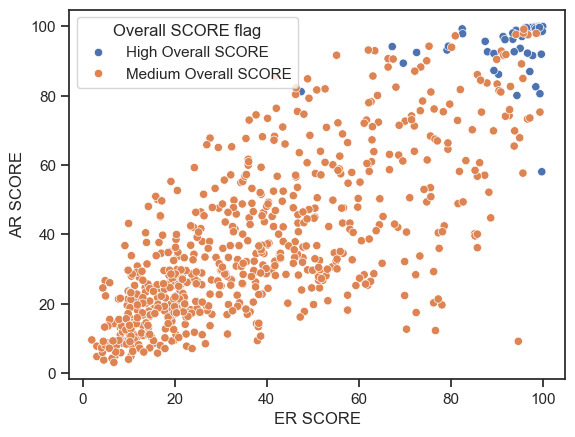

In [49]:
sns.set(style="ticks")

# Drop rows with NaN in the relevant columns
tmp = df.dropna(subset=["ER SCORE", "AR SCORE", "Overall SCORE flag"])

g = sns.scatterplot(
    x="ER SCORE", 
    y="AR SCORE", 
    hue="Overall SCORE flag", 
    data=tmp
)

plt.show()

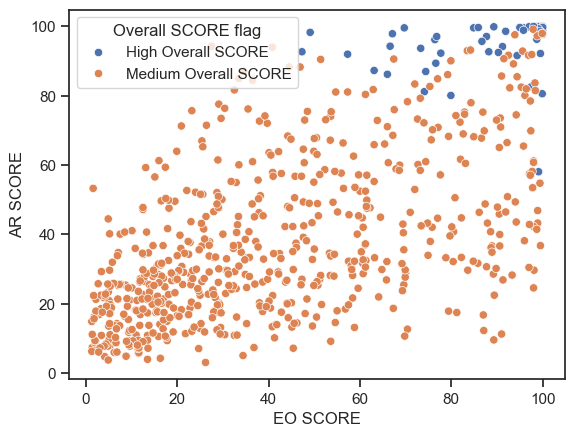

In [66]:
sns.set(style="ticks")

# Drop rows with NaN in the relevant columns
tmp = df.dropna(subset=["EO SCORE", "AR SCORE", "Overall SCORE flag"])

g = sns.scatterplot(
    x="EO SCORE", 
    y="AR SCORE", 
    hue="Overall SCORE flag", 
    data=tmp
)

plt.show()